# `2017 - 2022` Analysis

In [2]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from itertools import combinations
from collections import defaultdict

# Notes

> Code does a good job of filtering for `2017 - 2018`. 

> Needs to be tuned up for `2019 - 2022` because file changes occurred again, but mainly just file location

> For the sake of time, at the moment will settle for just moving on to include only directly relevant data to our analysis because of complication making the dataset play nice for `2017-2018` and `2019-2022`.

> For `2019 - 2022` need to find `DEATHINED`. Also for all years need dictionary to translate `SEX`, `EDDISCHARGEDISPOSITION`, `DEATHINED`, `HOSPDISCHARGEDISPOSITION`.

In [69]:
data_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/Data/Raw_data/PUF AY %i/CSV/'
years = range(2017, 2023)
thoracotomy_codes = ['0WJB0ZZ', '0WJ90ZZ', '02JA0ZZ', '02JY0ZZ', '0BJL0ZZ', '0BJK0ZZ', '0BJQ0ZZ','0WJ80ZZ', '0WJC0ZZ', '0WJD0ZZ', '02VW0CZ', '02QA0ZZ', '3E080GC']
sternotomy_codes = ['0P800ZZ']

mechanism_code_dict = {1:'Cut/pierce', 2:'Drowning/submersion', 3:'Fall', 4:'Fire/flame', 5:'Hot object/substance', 6:'Firearm', 7:'Machinery', 8:'MVT Occupant', 9:'MVT Motorcyclist', 10:'MVT Pedal cyclist', 11:'MVT Pedestrian', 12:'MVT Unspecified', 13:'MVT Other', 14:'Pedal cyclist, other', 15:'Pedestrian, other', 16:'Transport, other', 17:'Natural/environmental,  Bites and stings', 18:'Natural/environmental,  Other', 19:'Overexertion', 20:'Poisoning', 21:'Struck by, against', 22:'Suffocation', 23:'Other specified and classifiable', 24:'Other specified, not elsewhere classifiable', 25:'Unspecified', 26:'Adverse effects, medical care', 27:'Adverse effects, drugs'} # As noted in PUF dictionary
trauma_type_code_dict = {1:'Blunt', 2:'Penetrating', 3:'Burn', 4:'Other/unspecified', 9:'Activity Code - Not Valid as a Primary E-Code'} # As noted in PUF Dictionary
sex_code_dict = {1:'Male', 2:'Female', 3:'Unknown'}
eddischarge_code_dict = {1: 'Floor bed (general admission, non-specialty unit bed)', 2: 'Observation unit (unit that provides < 24 hour stays)', 3: 'Telemetry/step-down unit (less acuity than ICU)', 4: 'Home with services', 5: 'Deceased/expired', 6: 'Other (jail, institutional care, mental health, etc.)', 7: 'Operating Room', 8: 'Intensive Care Unit (ICU)', 9: 'Home without services', 10: 'Left against medical advice', 11: 'Transferred to another hospital'}
hospdischarge_disposition_code_dict = {1: 'Discharged/Transferred to a short-term general hospital for inpatient care', 2: 'Discharged/Transferred to an Intermediate Care Facility (ICF)', 3: 'Discharged/Transferred to home under care of organized home health service', 4: 'Left against medical advice or discontinued care', 5: 'Deceased/Expired', 6: 'Discharged to home or self-care (routine discharge)', 7: 'Discharged/Transferred to Skilled Nursing Facility (SNF)', 8: 'Discharged/Transferred to hospice care', 10: 'Discharged/Transferred to court/law enforcement', 11: 'Discharged/Transferred to inpatient rehab or designated unit', 12: 'Discharged/Transferred to Long Term Care Hospital (LTCH)', 13: 'Discharged/Transferred to a psychiatric hospital or psychiatric distinct part unit of a hospital', 14: 'Discharged/Transferred to another type of institution not defined elsewhere'}
deathined_code_dict = {1:'Arrived with NO signs of life', 2:'Arrived with signs of life'}
prehospca_code_dict = {1:'Yes', 2:'No'}
transport_mode_code_dict = {1:'Ground Ambulance', 2:'Helicopter Ambulance', 3:'Fixed-wing Ambulance', 4:'Private/Public Vehicle/Walk-in', 5:'Police', 6:'Other'}

cols17 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols19 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols17 = [x.upper() for x in cols17]
cols19 = [x.upper() for x in cols19]

common_cols = list(set(cols17) & set(cols19))

In [44]:
for year in years:
    
    if year in range(2017, 2019):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    elif year in range(2019, 2023):
        TRAUMA_df = pd.read_csv(data_fp%year + 'PUF_TRAUMA.csv')
        ICDPROCEDURE_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE.csv')
        ICDPROCEDURE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ICDPROCEDURE_LOOKUP.csv')
        ECODE_LOOKUP_df = pd.read_csv(data_fp%year + 'PUF_ECODE_LOOKUP.csv')
    else:
        pass
    
    TRAUMA_df.columns = map(str.upper, TRAUMA_df.columns)
    ICDPROCEDURE_df.columns = map(str.upper, ICDPROCEDURE_df.columns)
    ICDPROCEDURE_LOOKUP_df.columns = map(str.upper, ICDPROCEDURE_LOOKUP_df.columns)
    ECODE_LOOKUP_df.columns = map(str.upper, ECODE_LOOKUP_df.columns)
    
    if year in range(2019, 2023):
        ICDPROCEDURE_df['PROCEDUREMINS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTHRS']*60
        ICDPROCEDURE_df['PROCEDUREDAYS'] = ICDPROCEDURE_df['HOSPITALPROCEDURESTARTDAYS']
    else:
        pass
    
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[:, ['INC_KEY', 'ICDPROCEDURECODE', 'PROCEDUREMINS', 'PROCEDUREDAYS']]
    potential_thoracotomy = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['ICDPROCEDURECODE'].isin(thoracotomy_codes)]
    potential_thoracotomy = potential_thoracotomy.loc[potential_thoracotomy['PROCEDUREMINS'] <= 20.0]
    potential_thoracotomy = potential_thoracotomy.loc[potential_thoracotomy['PROCEDUREDAYS'] <= 1.0]
    potential_thoracotomy_cases = np.unique(potential_thoracotomy['INC_KEY'])
    sternotomy_cases = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['ICDPROCEDURECODE'].isin(sternotomy_codes)]
    sternotomy_cases = np.unique(sternotomy_cases['INC_KEY'])
    thoracotomy_cases = [x for x in potential_thoracotomy_cases if x not in sternotomy_cases]
    ICDPROCEDURE_df = ICDPROCEDURE_df.loc[ICDPROCEDURE_df['INC_KEY'].isin(thoracotomy_cases)]
    
    ICDPROCEDURE_LOOKUP_df = ICDPROCEDURE_LOOKUP_df.loc[:, ['ICDPROCEDURECODE', 'ICDPROCEDURECODE_DESC']]
    ECODE_LOOKUP_df = ECODE_LOOKUP_df.loc[:, ['ECODE', 'ECODE_DESC', 'MECHANISM', 'TRAUMATYPE']]
    
    procedure_dict = dict(zip(ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE'], ICDPROCEDURE_LOOKUP_df['ICDPROCEDURECODE_DESC'])) # create dictionary
    ICDPROCEDURE_df['ICDPROCEDURECODE'] = ICDPROCEDURE_df['ICDPROCEDURECODE'].replace(procedure_dict) # implement dictionary
    
    trauma_cols = np.unique(['INC_KEY', 'PRIMARYECODEICD10', 'AGEYEARS', 'SEX', 'EDDISCHARGEDISPOSITION', 'HOSPDISCHARGEDISPOSITION'] + common_cols)
    TRAUMA_df = TRAUMA_df.loc[:, trauma_cols]
    TRAUMA_df = TRAUMA_df.loc[TRAUMA_df['INC_KEY'].isin(np.unique(ICDPROCEDURE_df['INC_KEY']))]
    
    ecode_dict = dict(zip(ECODE_LOOKUP_df['ECODE'], ECODE_LOOKUP_df['ECODE_DESC'])) # create dictionary
    TRAUMA_df['PRIMARYECODEICD10'] = TRAUMA_df['PRIMARYECODEICD10'].replace(ecode_dict) # implement dictionary
    
    mechanism_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['MECHANISM'])) # create dictionary
    TRAUMA_df['MECHANISM'] = TRAUMA_df['PRIMARYECODEICD10'].map(mechanism_dict) # implement dictionary
    
    traumatype_dict = dict(zip(ECODE_LOOKUP_df['ECODE_DESC'], ECODE_LOOKUP_df['TRAUMATYPE'])) # create dictionary
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['PRIMARYECODEICD10'].map(traumatype_dict) # implement dictionary
    
    TRAUMA_df['MECHANISM'] = TRAUMA_df['MECHANISM'].replace(mechanism_code_dict) # implement dictionary
    
    TRAUMA_df['TRAUMATYPE'] = TRAUMA_df['TRAUMATYPE'].replace(trauma_type_code_dict) # implement dictionary
    
    TRAUMA_df['SEX'] = TRAUMA_df['SEX'].replace(sex_code_dict)
    
    TRAUMA_df['EDDISCHARGEDISPOSITION'] = TRAUMA_df['EDDISCHARGEDISPOSITION'].replace(eddischarge_code_dict) # implement dictionary
    
    TRAUMA_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_df['HOSPDISCHARGEDISPOSITION'].replace(hospdischarge_disposition_code_dict) # implement dictionary
    
    
    TRAUMA_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/TRAUMA_df_%i.csv'%year, index=False)
    ICDPROCEDURE_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/ICDPROCEDURE_df_%i.csv'%year, index=False)
    
    display(ICDPROCEDURE_df.head())
    display(TRAUMA_df.head())

,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
8989,170000020367,Insertion of Infusion Device into Right Femora...,7.0,1.0
8990,170000020367,"Performance of Cardiac Output, Single, Manual",12.0,1.0
8991,170000020367,"Repair Thoracic Aorta, Ascending/Arch, Open Ap...",12.0,1.0
8992,170000020367,Transfusion of Nonautologous Red Blood Cells i...,9.0,1.0
8993,170000020367,Transfusion of Nonautologous Frozen Plasma int...,NaN,NaN


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
1825,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating
2473,NaN,1.0,2.0,NaN,NaN,1.0,29.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating
2784,NaN,1.0,2.0,NaN,NaN,1.0,28.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
2841,NaN,1.0,2.0,NaN,NaN,1.0,17.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
3641,NaN,1.0,2.0,NaN,NaN,1.0,30.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
8912,180014722297,"Inspection of Heart, Open Approach",9.0,1.0
8913,180014722297,"Performance of Cardiac Output, Single, Manual",2.0,1.0
8914,180014722297,Drainage of Right Pleural Cavity with Drainage...,4.0,1.0
9134,180014722297,"Insertion of Endotracheal Airway into Trachea,...",10.0,1.0
9135,180014722297,"Respiratory Ventilation, Less than 24 Consecut...",0.0,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
2646,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,Firearm,Penetrating
3257,NaN,1.0,2.0,NaN,NaN,1.0,71.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
4440,NaN,1.0,2.0,NaN,NaN,1.0,22.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,Firearm,Penetrating
5618,NaN,1.0,2.0,NaN,NaN,1.0,38.0,0,1,0,...,1,2.0,NaN,NaN,NaN,1.0,NaN,2018.0,Other specified and classifiable,Blunt
7239,NaN,1.0,2.0,NaN,NaN,1.0,47.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,2018.0,MVT Occupant,Blunt


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
15472,190031200522,Drainage of Right Pleural Cavity with Drainage...,3.0,1.0
15473,190031200522,"Inspection of Left Pleural Cavity, Open Approach",1.8,1.0
15474,190031200522,"Occlusion of Thoracic Aorta, Descending with I...",3.0,1.0
15475,190031200522,"Insertion of Endotracheal Airway into Trachea,...",6.0,1.0
15476,190031200522,"Occlusion of Thoracic Aorta, Descending with I...",10.2,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
4,NaN,1.0,2.0,NaN,NaN,1.0,47.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Cut/pierce,Penetrating
19,NaN,1.0,2.0,NaN,NaN,1.0,40.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
156,NaN,1.0,2.0,NaN,NaN,1.0,21.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
373,NaN,1.0,2.0,NaN,NaN,1.0,19.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
798,NaN,1.0,2.0,NaN,NaN,1.0,42.0,0,1,0,...,0,2.0,NaN,NaN,NaN,1.0,NaN,NaN,Fall,Blunt


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
13404,200043224492,"Repair Heart, Open Approach",49.8,1.0
13405,200043224492,Insertion of Intraluminal Device into Right Fe...,NaN,1.0
13406,200043224492,Insertion of Infusion Device into Right Femora...,NaN,1.0
13407,200043224492,"Excision of Spleen, Open Approach",49.8,1.0
13408,200043224492,"Excision of Left Lung, Open Approach",49.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
2010,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
2871,NaN,NaN,NaN,NaN,NaN,NaN,60.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Pedestrian,Blunt
6882,NaN,NaN,NaN,NaN,NaN,NaN,37.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
7027,NaN,NaN,NaN,NaN,NaN,NaN,41.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
7271,NaN,NaN,NaN,NaN,NaN,NaN,20.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
12941,210057983007,"Occlusion of Thoracic Aorta, Descending with I...",NaN,1.0
12942,210057983007,"Repair Heart, Open Approach",1.8,1.0
12943,210057983007,Insertion of Infusion Device into Right Subcla...,NaN,1.0
12944,210057983007,"Insertion of Endotracheal Airway into Trachea,...",1.8,1.0
12945,210057983007,Drainage of Right Pleural Cavity with Drainage...,6.0,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
1695,NaN,NaN,NaN,NaN,NaN,NaN,29.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1714,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1764,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,...,0,2.0,NaN,NaN,NaN,NaN,2.0,NaN,Firearm,Penetrating
1843,NaN,NaN,NaN,NaN,NaN,NaN,24.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS
4686,220063640246,"Insertion of Endotracheal Airway into Trachea,...",3.0,1.0
4687,220063640246,Drainage of Right Pleural Cavity with Drainage...,4.2,1.0
4688,220063640246,Drainage of Left Pleural Cavity with Drainage ...,4.8,1.0
4689,220063640246,"Inspection of Right Pleural Cavity, Open Approach",4.8,1.0
4690,220063640246,"Inspection of Left Pleural Cavity, Open Approach",4.8,1.0


,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WHITE,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE
736,NaN,NaN,NaN,NaN,NaN,NaN,58.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
783,NaN,NaN,NaN,NaN,NaN,NaN,79.0,0,1,0,...,1,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Pedestrian,Blunt
1302,NaN,NaN,NaN,NaN,NaN,NaN,28.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
1754,NaN,NaN,NaN,NaN,NaN,NaN,17.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating
3289,NaN,NaN,NaN,NaN,NaN,NaN,38.0,0,1,0,...,0,2.0,NaN,NaN,NaN,2.0,NaN,NaN,MVT Pedestrian,Blunt


## Devising way to get thoracotomies that started on the left `ONLY`

> Shouldn't be any right thoracotomies before left in true EDT protocol.

> Also found in the data that there are additional thoracotomies performed on the same patient, sometimes as short as within 30 minutes of each other (i.e. at 18 min and 48 min following arrival to the ED)

> Below code block needs to be tuned up to work correctly

# What questions should I be asking next?

*Several of these are likely independent projects of their own*

1. Age guideline/ cutoff
    - Create age vs mortality graph, hue = injury type
    - Can compare over the years
    - Histogram of age
2. Mortality based on timing and performing EDT (mortality rate too excessive if not performed within x minutes)
    - Mortality vs. PROCEDUREMINS for thoracotomy, hue = injury type
3. Complications/ comorbidity
    - probably has to be in a table format
4. Evaluate WTA/ EAST guidelines vs not followed
    - will be more complicated, could mainly focus on pre-hospital cpr time and sol for criteria
5. Create a machine learning algorithm using small subset of data, ideally data that is easily integrated across all years into one dataframe (simple is better given the complexity of machine learning and lack of ability to get substantial advising on the technical side).
    - Will likely need to stay within the realm of linear regression models that I am already familiar with if this is to be pursued. Plus this will help keep clinical people happy when trying to explain as AI/ NN solutions quickly just become mysterious black box of confusion

# Progress Note to Self:

> Was able to generate table with some information (not everything) combined, in theory I think this is enough to do the project.

> Next steps for today would be to create a dataframe that has `ED Mortality`, `Hospital Mortality` and `Overall Mortality` calculated for `2017 -  2022`. 

> We can use unique `INC_KEY` to select the unique individuals for the mortality calculations. In terms of data exploration of the data available, we can make the following figures:
    - Histogram of age
    - Bar plot comparing female vs male cases
    - Plot showing number of `ICDPROCEDURECODE` used for various mechanisms of injury
    - Plot showing people who died in the ED vs hospital
    - Plot of injury type
    - Plot of mechanism (i.e. firearm etc.)
    - Plot of time to first procedure for each of the potential thoracotomy labels
    - ED/ HOSP mortality vs age, hue = MOI, include all years
    
> **Update** return to above for data and code into dictionary that for `SEX` there is a value `3.0` which is presumed to be unknown (although this is not specified in the `NTDB Data Dictionary`.

> **Update** NaN values need to be converted for ED/HOSP DISPO to be shown as unknown

# Data Exploration of Thoracotomy Data Population

## Combine years of data into one `DataFrame` for figure generation

In [3]:
years = range(2017, 2023)
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/TRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/ICDPROCEDURE_df_%i.csv'
TRAUMA_cols = pd.read_csv(TRAUMA_fp%2017, nrows=1).columns.tolist().append('Year')
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp%2017, nrows=1).columns.tolist().append('Year')

TRAUMA_all_df = pd.DataFrame(columns=TRAUMA_cols)
ICDPROCEDURE_all_df = pd.DataFrame(columns=ICDPROCEDURE_cols)

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp%year)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp%year)
    icdprocedure_df['Year'] = year
    TRAUMA_all_df = pd.concat([TRAUMA_all_df, trauma_df], ignore_index=True)
    ICDPROCEDURE_all_df = pd.concat([ICDPROCEDURE_all_df, icdprocedure_df], ignore_index=True)

TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'] = TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].fillna('Unknown')
TRAUMA_all_df['EDDISCHARGEDISPOSITION'] = TRAUMA_all_df['EDDISCHARGEDISPOSITION'].fillna('Unknown')
TRAUMA_all_df['SEX'] = TRAUMA_all_df['SEX'].replace('3.0', 'Unknown')

display(TRAUMA_all_df.head())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.head())
print(np.shape(ICDPROCEDURE_all_df))

,ABUSEINVESTIGATION,ABUSEINVESTIGATION_BIU,ABUSEREPORT,ABUSEREPORT_BIU,ADDITIONALECODEICD10,ADDITIONALECODEICD10_BIU,AGEYEARS,AIRBAG_DEPLOYED_FRNT,AIRBAG_DEPLOYED_NA,AIRBAG_DEPLOYED_OTHER,...,WITHDRAWALLST,WITHDRAWALLSTDAYS,WITHDRAWALLSTMINS,WITHDRAWALLST_BIU,WORKRELATED,WORKRELATED_BIU,YODISCH,MECHANISM,TRAUMATYPE,Year
0,NaN,1.0,2.0,NaN,NaN,1.0,24.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating,2017
1,NaN,1.0,2.0,NaN,NaN,1.0,29.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,2017.0,Firearm,Penetrating,2017
2,NaN,1.0,2.0,NaN,NaN,1.0,28.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating,2017
3,NaN,1.0,2.0,NaN,NaN,1.0,17.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating,2017
4,NaN,1.0,2.0,NaN,NaN,1.0,30.0,0,1,0,...,2.0,NaN,NaN,NaN,2.0,NaN,NaN,Firearm,Penetrating,2017


(14067, 333)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
0,170000020367,Insertion of Infusion Device into Right Femora...,7.0,1.0,2017
1,170000020367,"Performance of Cardiac Output, Single, Manual",12.0,1.0,2017
2,170000020367,"Repair Thoracic Aorta, Ascending/Arch, Open Ap...",12.0,1.0,2017
3,170000020367,Transfusion of Nonautologous Red Blood Cells i...,9.0,1.0,2017
4,170000020367,Transfusion of Nonautologous Frozen Plasma int...,NaN,NaN,2017


(175785, 5)


## Age Demographics

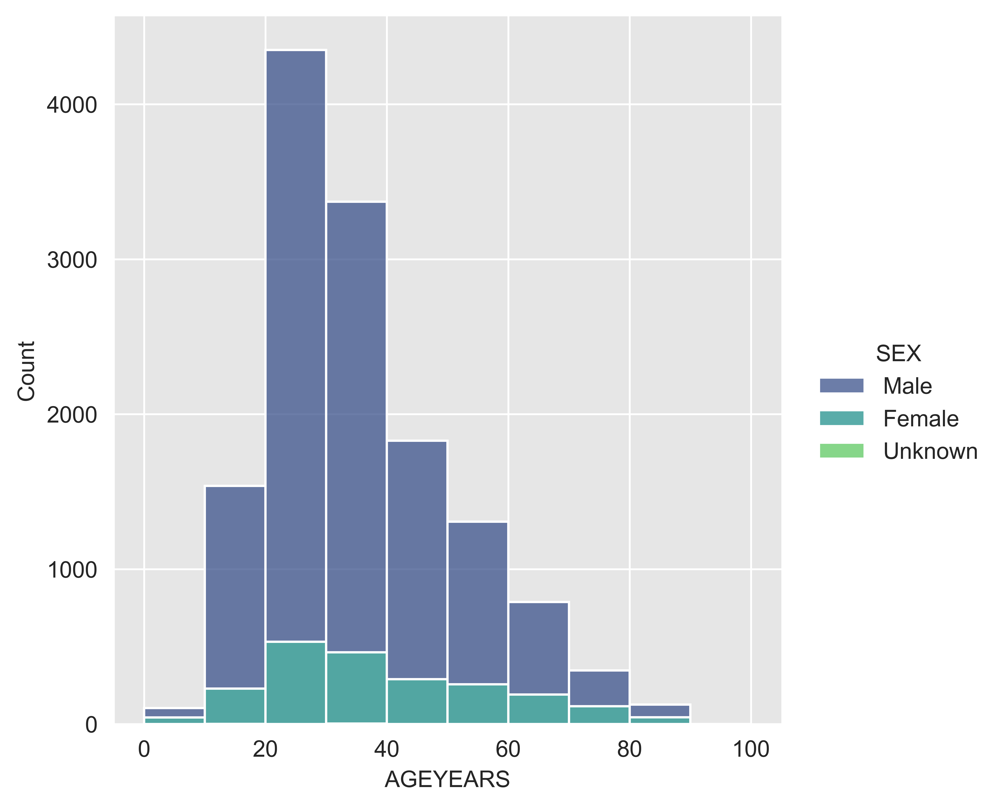

In [93]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='SEX',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

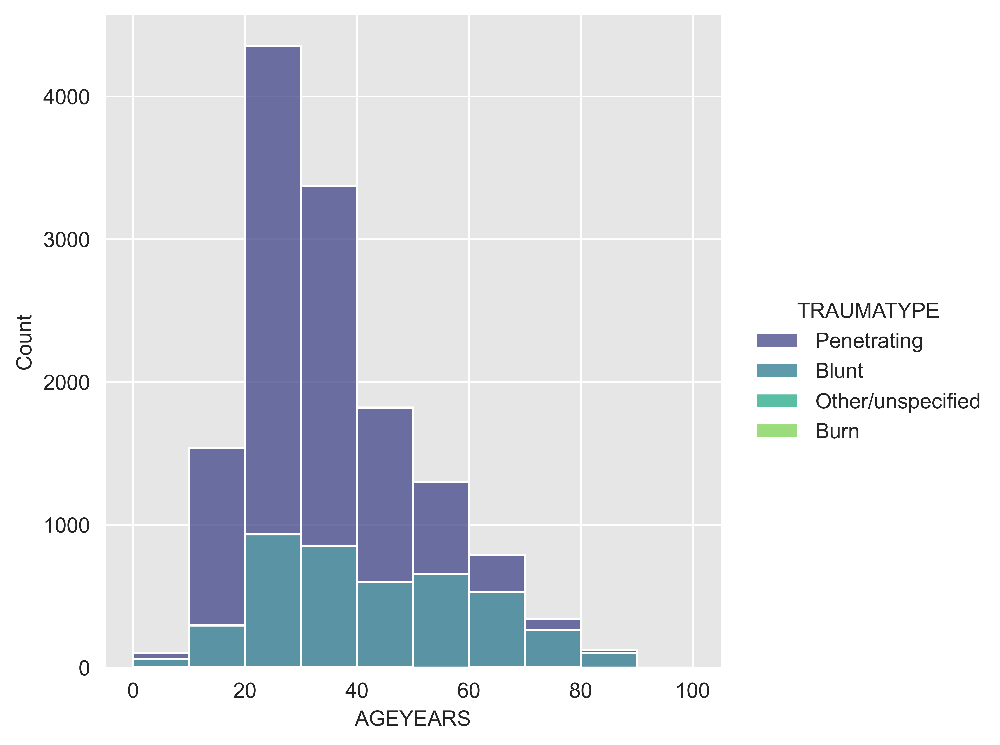

In [94]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='TRAUMATYPE',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

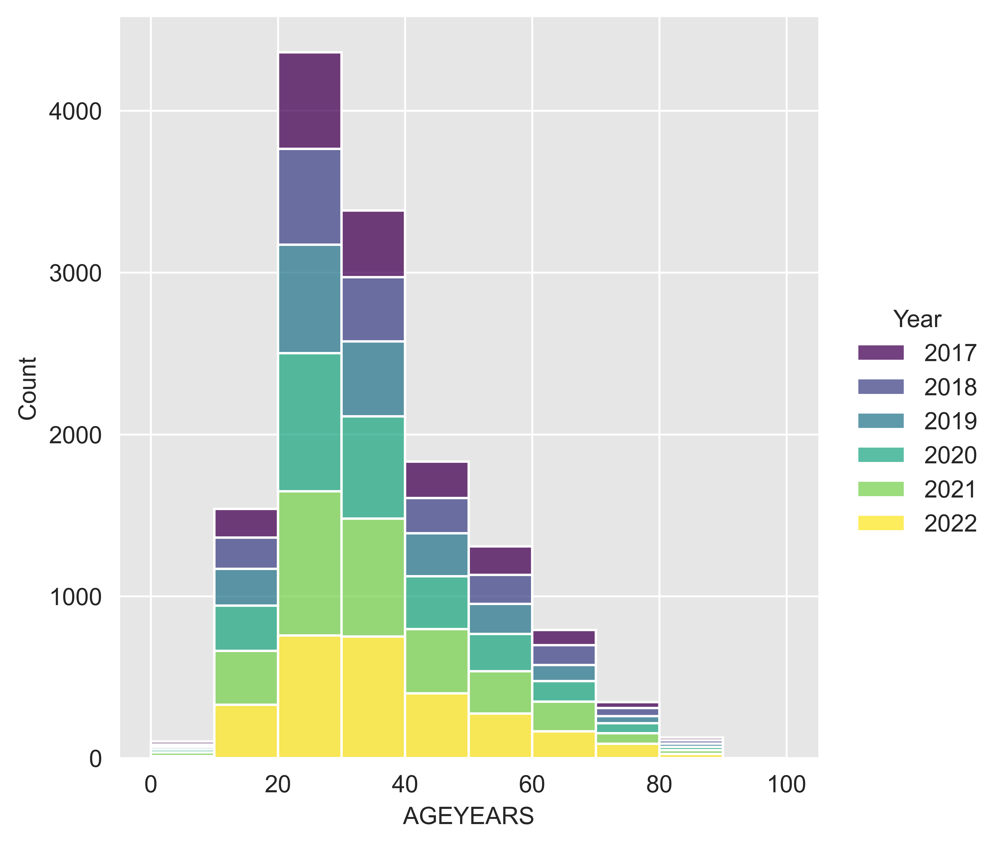

In [95]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='Year',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

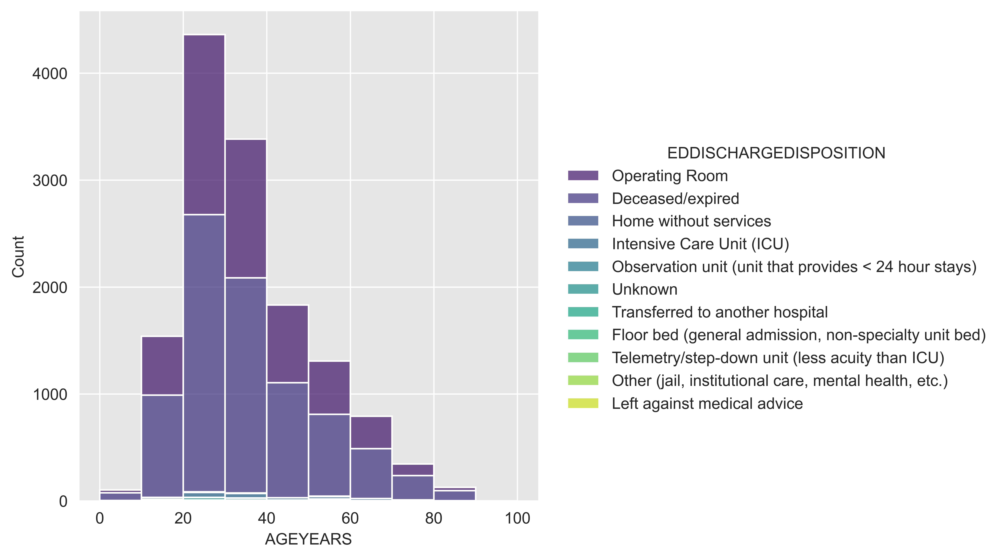

In [96]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='EDDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

In [97]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.displot(data=TRAUMA_all_df,
               x='AGEYEARS',
               hue='HOSPDISCHARGEDISPOSITION',
               stat='count',
               binwidth=10,
               binrange=(0,100),
               palette='viridis',
               multiple='stack')
plt.show()

# Data about ICD Procedures (Includes **ALL** Procedures, not just the thoracomies but is only using thoracotomy patients)

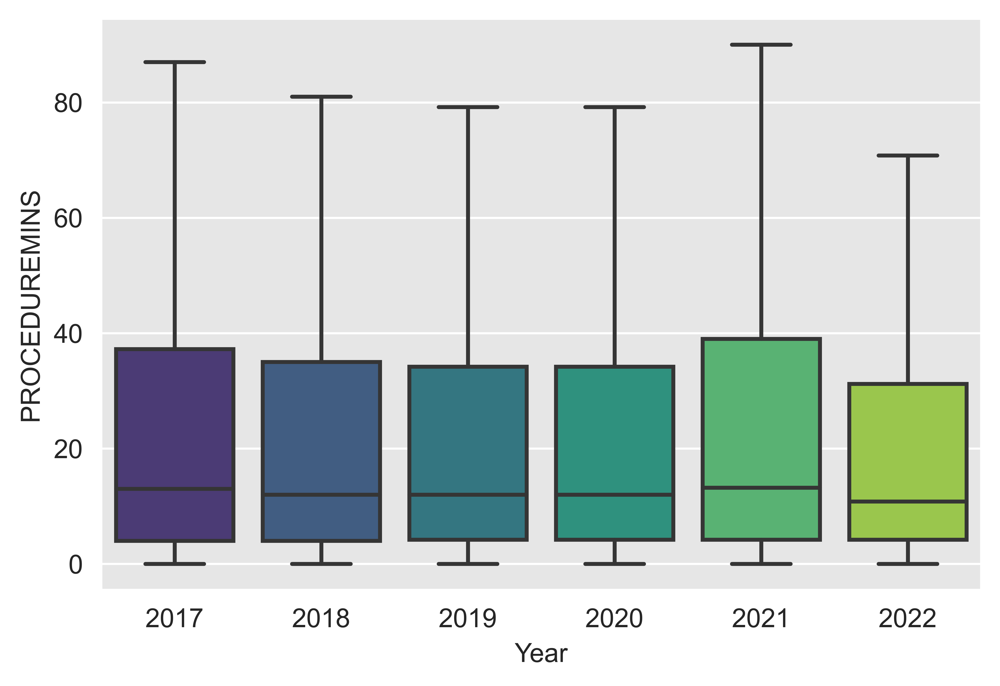

In [98]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

> This figure shows that a majority of patients who underwent a thoracotomy had their procedures performed within the first day (i.e. likely because most didn't survive to subsequent days)

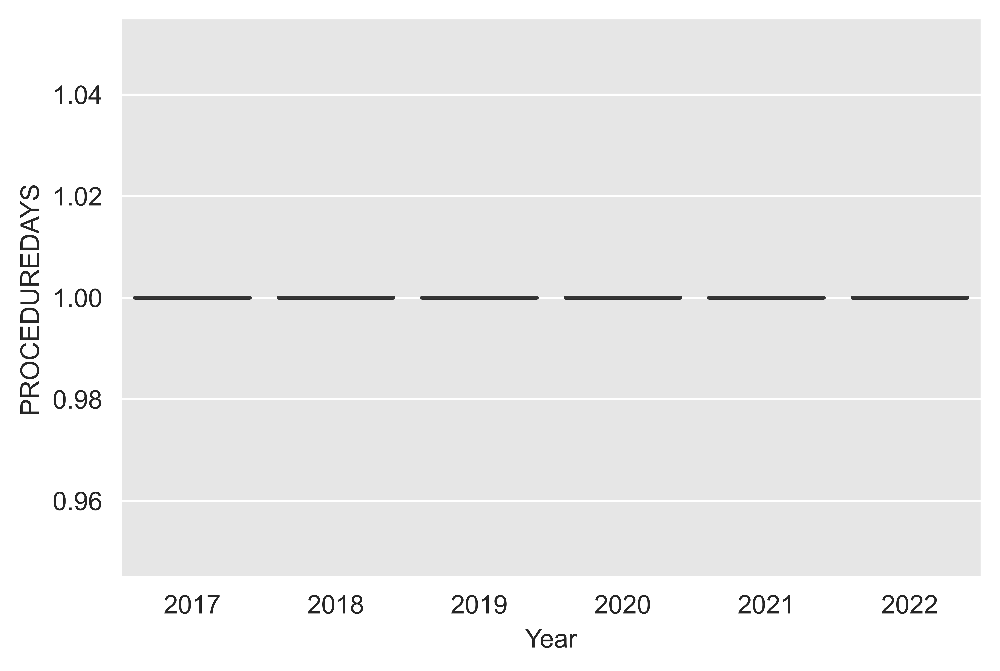

In [99]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

> If you include outliers from previous figure there are a numerous patients that underwent procedures outside of the first day, however, **ALL** of these are considered outliers in the data (i.e. surviving past the first day makes you an outlier)

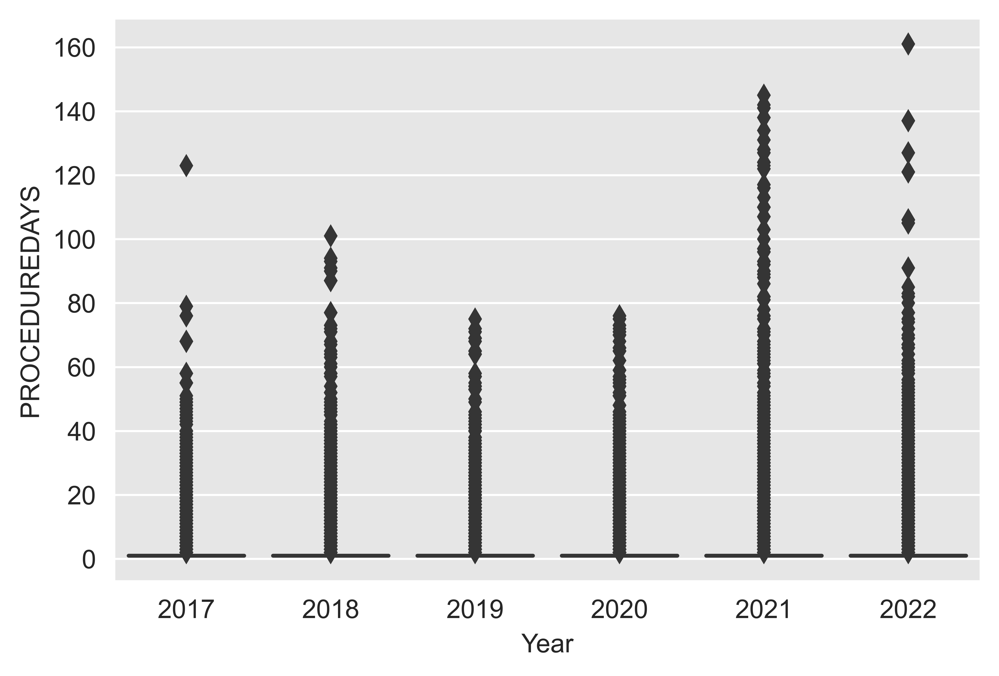

In [100]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=ICDPROCEDURE_all_df,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

# Thoracotomy Patients, Only Looking at Procedures We Deemed Directly Thoracotomy Related

> A notable feature is that there are instances in which repeats of a procedure are performed in a relatively short period of time after the initial procedure as evidenced below in the displayed table. The population of patients used to generate this figure already have had patients filtered **OUT** that did not have their first thoracotomy/ adjacent procedure performed within the first **20 minutes**, therefore, any procedures performed outside of this window but are still in our list of thoracotomy procedures are from patients that **ALSO** had a thoracotomy/ related procedure within the first 20 minutes. This indicates that the filtering methods used above seemed to have worked fine and also brings up an intersting thing to explore which is why there are so many repeated procedures for the same individual within this first hour or so (i.e. are these procedures that were started in the ED and then resumed/ reinvestigated in the OR, did the patient recover and then deteriorate again prompting reinspection of the heart etc).

,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
6,170000020367,"Repair Heart, Open Approach",12.0,1.0,2017
12,170000046992,"Repair Heart, Open Approach",13.0,1.0,2017
22,170000046992,"Repair Heart, Open Approach",36.0,1.0,2017
30,170000057961,"Inspection of Left Pleural Cavity, Open Approach",3.0,1.0,2017
38,170000021290,"Repair Heart, Open Approach",11.0,1.0,2017


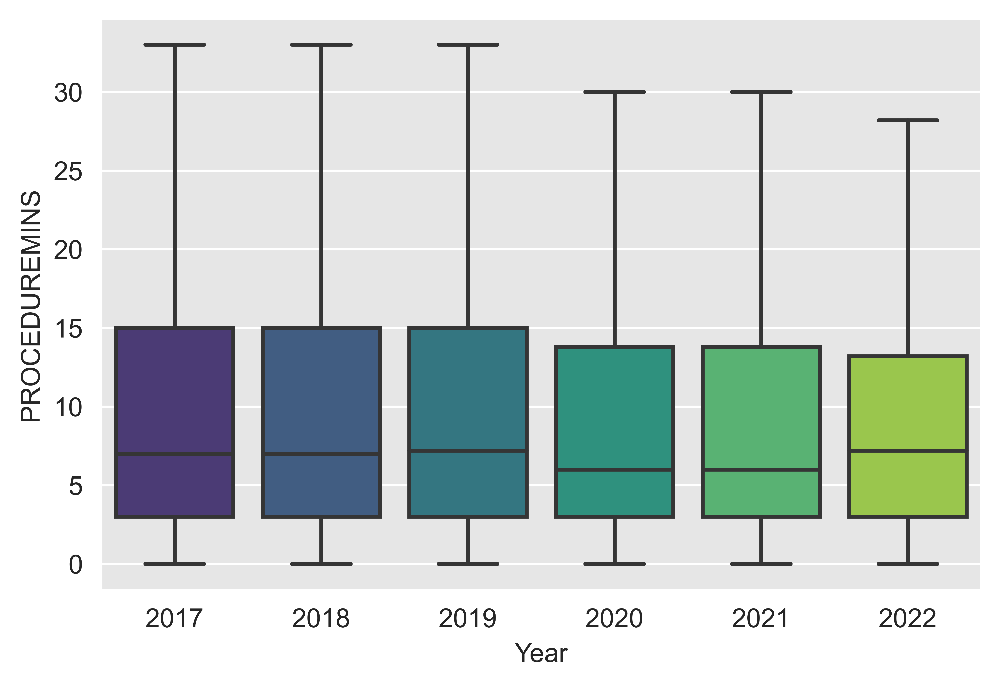

In [101]:
thoracotomy_translated = pd.DataFrame(thoracotomy_codes, columns=['Codes'])
thoracotomy_translated = thoracotomy_translated['Codes'].replace(procedure_dict)
thoracotomy_timing = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['ICDPROCEDURECODE'].isin(thoracotomy_translated)]
display(thoracotomy_timing.head())

mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=thoracotomy_timing,
               y='PROCEDUREMINS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

> The below figure is obviously uninteresting but validates that the filtering protocols in previous steps at the very least limited the procedures to the thoracotomies performed on the same day as arrival to the ED.

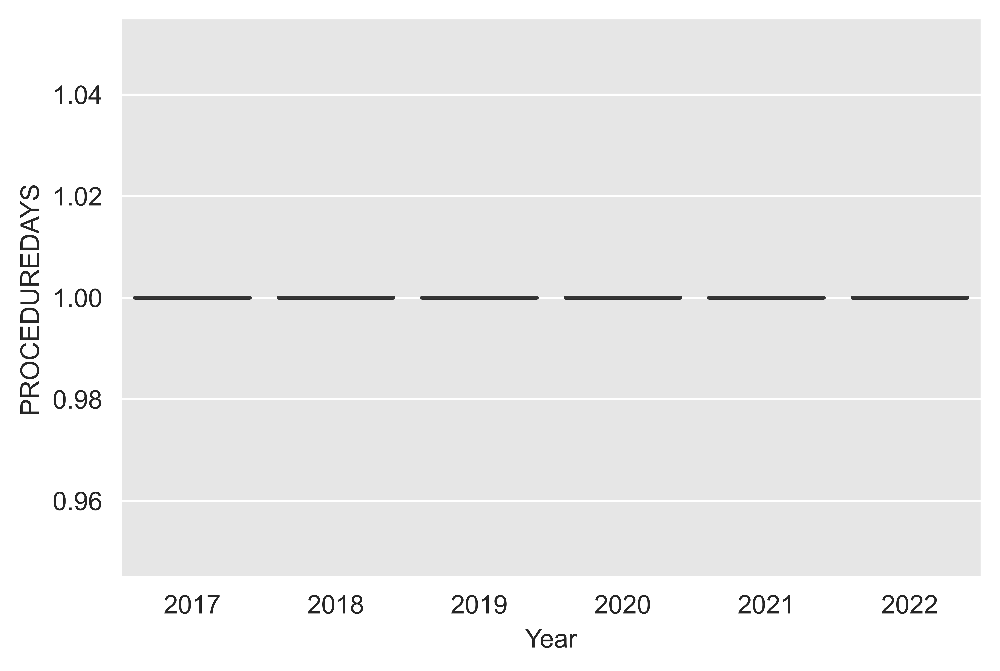

In [102]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=thoracotomy_timing,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=False,
               palette='viridis')
plt.show()

> Of the people who underwent an initial thoracotomy within the first 20 minutes, the vast majority underwent these procedures within the first day. As demonstrated by the presence of the below outliers, there are patients who underwent subsequent thoracotomy/ related procedures following the initial thoracotomy/ related procedure.

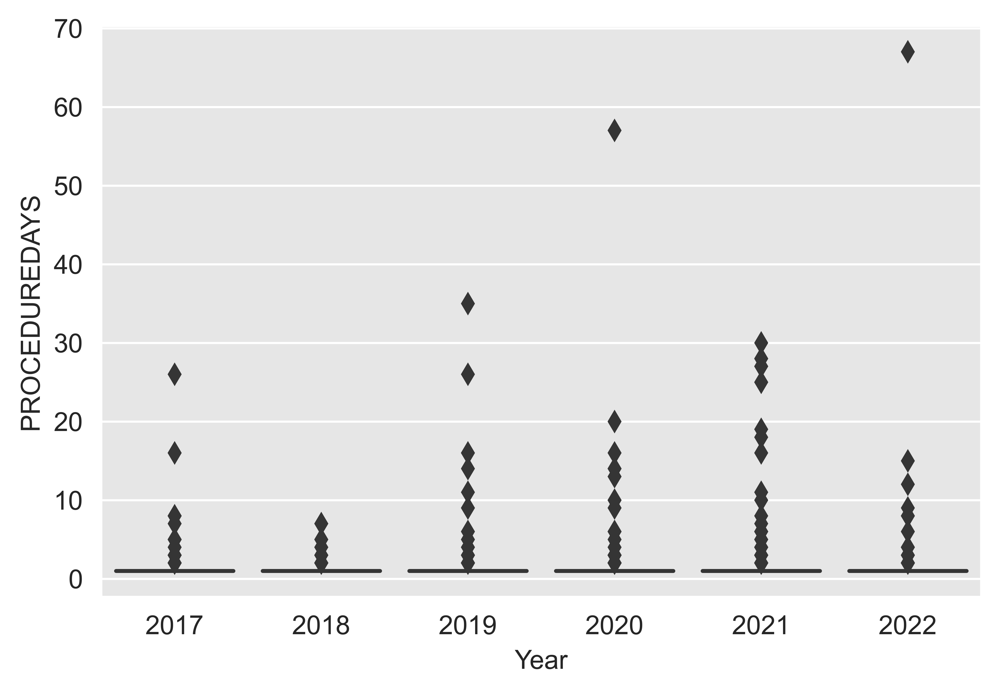

In [103]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=thoracotomy_timing,
               y='PROCEDUREDAYS',
               x='Year',
               showfliers=True,
               palette='viridis')
plt.show()

# Create Mortality Statistics
## Create `DataFrame` of Mortality by `Year` and `Mechanism`

In [104]:
mortality_year_table = pd.DataFrame(columns=['Year', 'Mortality %', 'MOI', '# of Cases'])
years = range(2017, 2023) # set to year 2016 for max with this part of pipeline
for year in years:
    year_df = TRAUMA_all_df[TRAUMA_all_df['Year'] == year]
    penetrating_df = year_df[year_df['TRAUMATYPE'] == 'Penetrating']
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(penetrating_df)[0] == 0:
        mortality_pen_p = np.nan
    else:
        mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    
    blunt_df = year_df[year_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(blunt_df)[0] == 0:
        mortality_blunt_p = np.nan
    else:
        mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100        
    
    final_pen_df = pd.DataFrame([[year, mortality_pen_p, 'Penetrating', np.shape(penetrating_df)[0]]], columns=['Year', 'Mortality %', 'MOI', '# of Cases'])
    final_blunt_df = pd.DataFrame([[year, mortality_blunt_p, 'Blunt', np.shape(blunt_df)[0]]], columns=['Year', 'Mortality %', 'MOI', '# of Cases'])
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Year', 'Mortality %', 'MOI', '# of Cases'])
    mortality_year_table = pd.concat([mortality_year_table, combined_df])
mortality_year_table['Mortality %'] = mortality_year_table['Mortality %'].astype(float)
mortality_year_table['Year'] = mortality_year_table['Year'].astype(int)
display(mortality_year_table.head())

,Year,Mortality %,MOI,# of Cases
0,2017,89.727127,Penetrating,1246
1,2017,95.841210,Blunt,529
0,2018,92.537313,Penetrating,1273
1,2018,94.633274,Blunt,559
0,2019,92.141312,Penetrating,1387


## Plot Year vs. Mortality

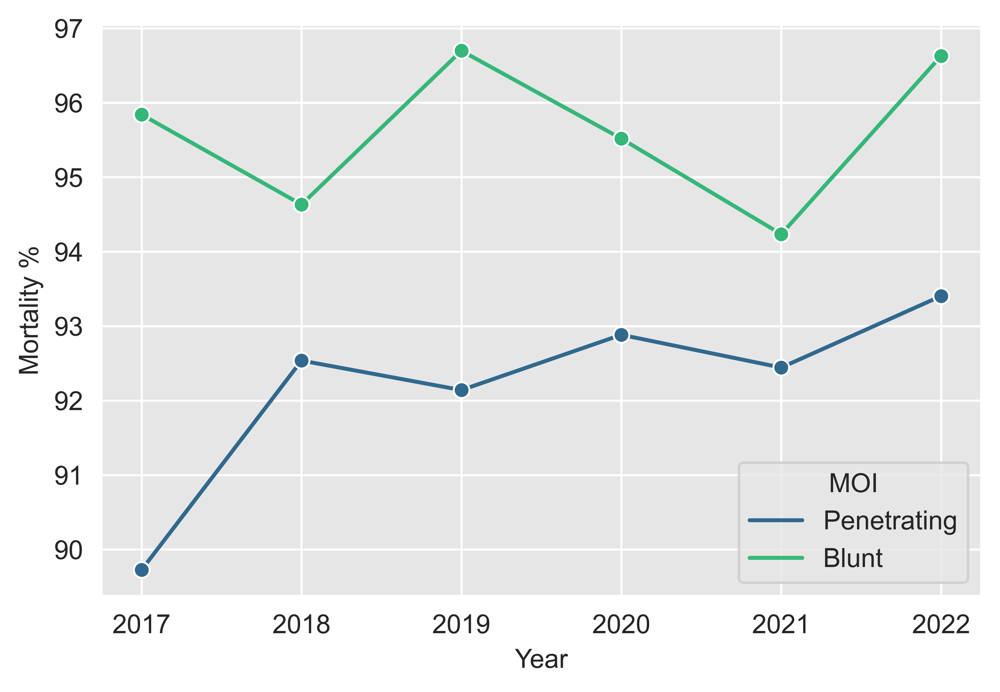

In [105]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_year_table,
               y='Mortality %',
               x='Year',
               hue='MOI',
               palette='viridis',
               marker='o')
plt.show()

## Create `DataFrame` of Mortality by `Age` and `Trauma Type`

In [106]:
mortality_age_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)

for age_range in age_ranges:
    age_range_df = TRAUMA_all_df[(TRAUMA_all_df['AGEYEARS'] > age_range+1) & (TRAUMA_all_df['AGEYEARS'] <= age_range+10)]
    penetrating_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(penetrating_df)[0] == 0:
        mortality_pen_p = np.nan
    else:
        mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
    
    blunt_df = age_range_df[age_range_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(blunt_df)[0] == 0:
        mortality_blunt_p = np.nan
    else:
        mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_blunt_df['Age Range'] = '%i - %i'%(age_range+1, age_range+10)
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Age Range', '# of Cases'])
    mortality_age_table = pd.concat([mortality_age_table, combined_df])
mortality_age_table['Mortality %'] = mortality_age_table['Mortality %'].astype(float)
mortality_age_table['Age Range'] = mortality_age_table['Age Range'].astype(str)
display(mortality_age_table)

,Mortality %,Trauma Type,Age Range,# of Cases
0,100.000000,Penetrating,1 - 10,49
1,94.736842,Blunt,1 - 10,57
0,92.522180,Penetrating,11 - 20,1578
1,94.957983,Blunt,11 - 20,357
0,92.035398,Penetrating,21 - 30,3164
1,94.851259,Blunt,21 - 30,874
0,91.795127,Penetrating,31 - 40,2011
1,94.972067,Blunt,31 - 40,716
0,91.769547,Penetrating,41 - 50,972
1,95.281307,Blunt,41 - 50,551


# Plot Age vs. Mortality %

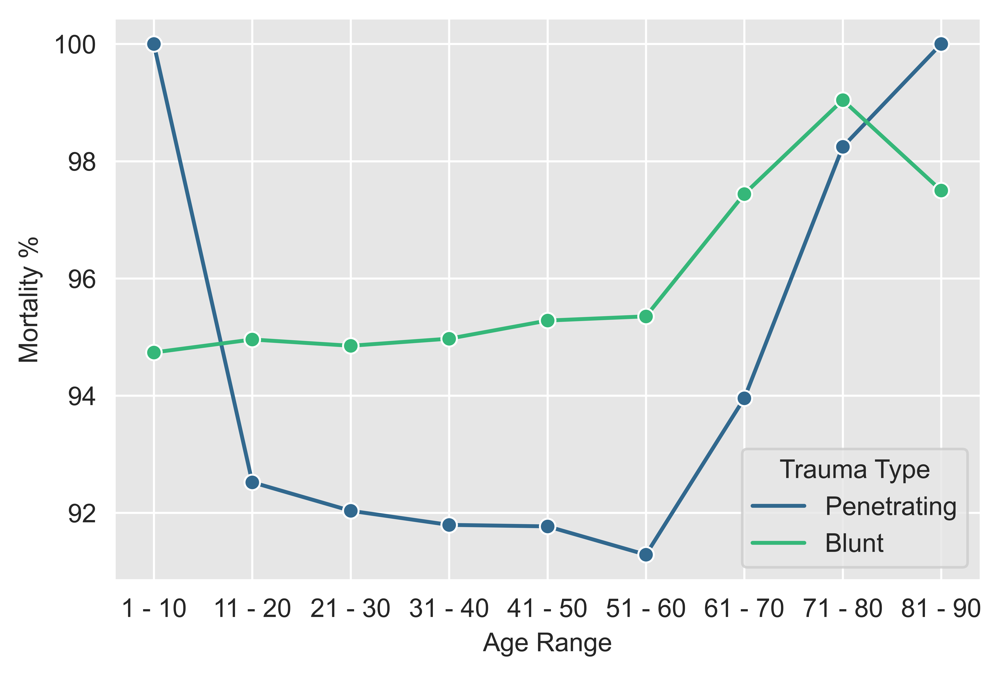

In [107]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_age_table,
               y='Mortality %',
               x='Age Range',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

## Create `DataFrame` of Mortality by `PROCEDUREMINS` and `Trauma Type`

In [4]:
mortality_proctime_table = pd.DataFrame(columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
proc_times = range(0,21, 1)

time_min_df = pd.DataFrame(columns=['INC_KEY', 'PROCEDUREMINS'])
for inc_key in np.unique(ICDPROCEDURE_all_df['INC_KEY']):
    inc_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'] == inc_key]
    first_proc_df = inc_df.loc[inc_df['PROCEDUREMINS'] == np.min(np.unique(inc_df['PROCEDUREMINS']))]
    if np.shape(first_proc_df)[0] == 0:
        continue
    first_proc_min = first_proc_df['PROCEDUREMINS'].tolist()[0]
    new_df = pd.DataFrame([[inc_key, first_proc_min]], columns=['INC_KEY', 'PROCEDUREMINS'])
    time_min_df = pd.concat([time_min_df, new_df])
    
for time in proc_times:
    time_min_keys = time_min_df.loc[time_min_df['PROCEDUREMINS'] == time]
    trauma_time_df = TRAUMA_all_df.loc[TRAUMA_all_df['INC_KEY'].isin(time_min_keys['INC_KEY'])]
    penetrating_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Penetrating'])]
    expired_pen_df1 = penetrating_df[penetrating_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_pen_df2 = penetrating_df[penetrating_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(penetrating_df)[0] == 0:
        mortality_pen_p = np.nan
    else:
        mortality_pen_p = ((np.shape(expired_pen_df1)[0] + np.shape(expired_pen_df2)[0])/np.shape(penetrating_df)[0]) * 100
        
    blunt_df = trauma_time_df[trauma_time_df['TRAUMATYPE'].isin(['Blunt'])]
    expired_blunt_df1 = blunt_df[blunt_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    expired_blunt_df2 = blunt_df[blunt_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
    
    if np.shape(blunt_df)[0] == 0:
        mortality_blunt_p = np.nan
    else:
        mortality_blunt_p = ((np.shape(expired_blunt_df1)[0] + np.shape(expired_blunt_df2)[0])/np.shape(blunt_df)[0]) * 100
    
    final_pen_df = pd.DataFrame([[mortality_pen_p, 'Penetrating']], columns=['Mortality %', 'Trauma Type'])
    final_blunt_df = pd.DataFrame([[mortality_blunt_p, 'Blunt']], columns=['Mortality %', 'Trauma Type'])
    final_pen_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_blunt_df['Procedure Time (Minutes after ED Arrival)'] = time
    final_pen_df['# of Cases'] = np.shape(penetrating_df)[0]
    final_blunt_df['# of Cases'] = np.shape(blunt_df)[0]
    combined_df = pd.DataFrame(np.vstack((final_pen_df, final_blunt_df)), columns=['Mortality %', 'Trauma Type', 'Procedure Time (Minutes after ED Arrival)', '# of Cases'])
    mortality_proctime_table = pd.concat([mortality_proctime_table, combined_df])
mortality_proctime_table['Mortality %'] = mortality_proctime_table['Mortality %'].astype(float)
display(mortality_proctime_table

SyntaxError: unexpected EOF while parsing (<ipython-input-4-0d6e2b70c09c>, line 44)

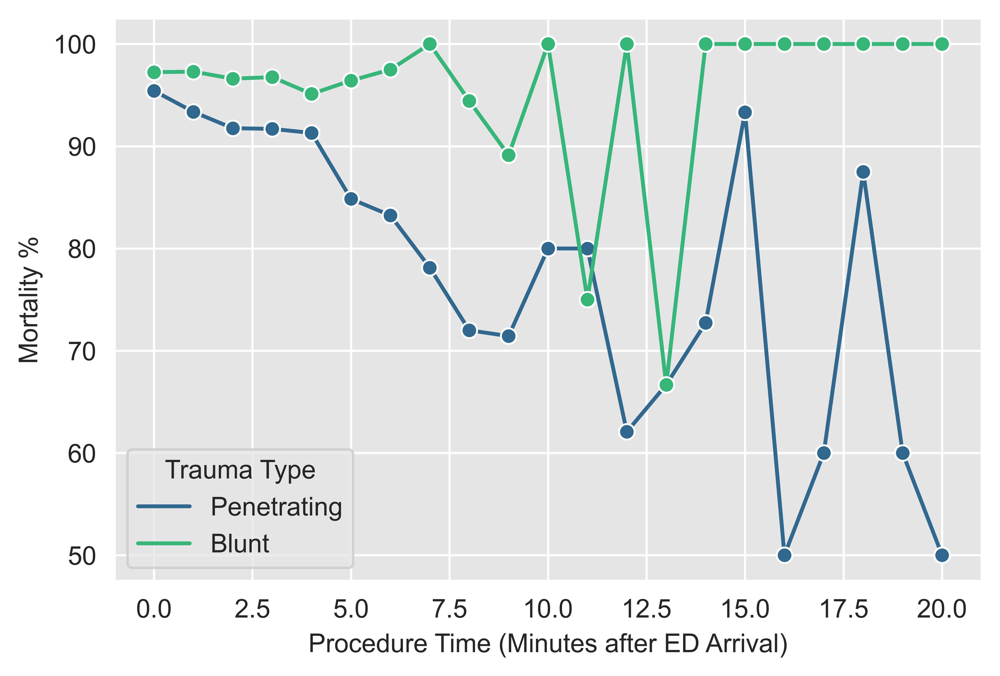

In [109]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.lineplot(data=mortality_proctime_table,
               y='Mortality %',
               x='Procedure Time (Minutes after ED Arrival)',
               hue='Trauma Type',
               palette='viridis',
               marker='o')
plt.show()

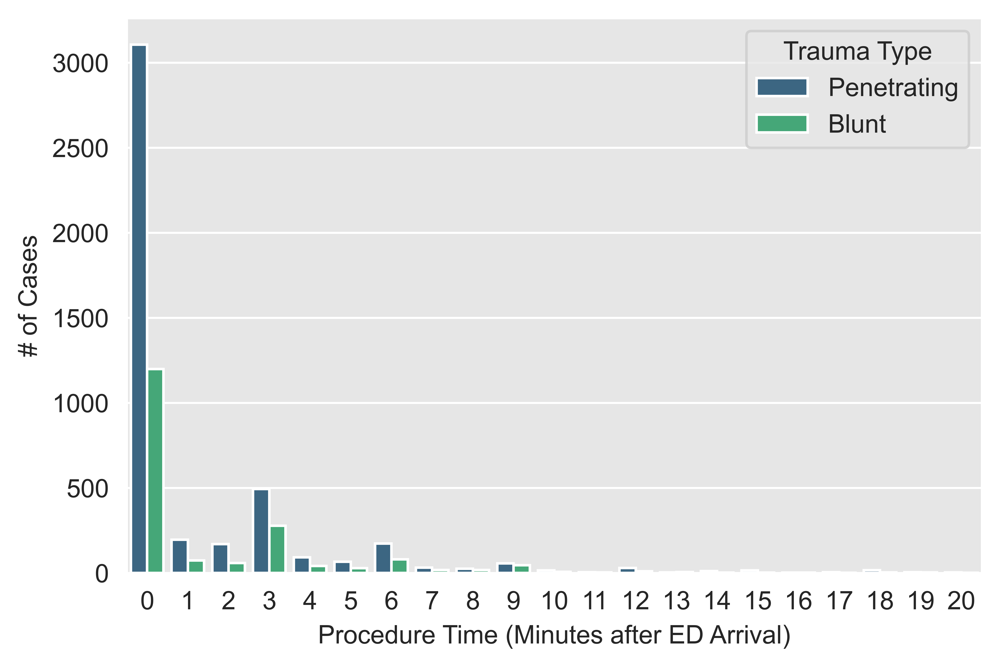

In [110]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.barplot(data=mortality_proctime_table, x='Procedure Time (Minutes after ED Arrival)', y='# of Cases', hue='Trauma Type', palette='viridis')
plt.show()

## Create Mortality Table for `Mechanism` and `Age Range`

> The below method should be adapted into the above scenarios for easier and more adaptable generation of tables

In [111]:
mortality_mechanism_table = pd.DataFrame(columns=['Mortality %', 'Mechanism', 'Age Range', '# of Cases'])
age_ranges = range(0, 110, 10)
trauma_types = TRAUMA_all_df['MECHANISM'].unique()

for age_range in age_ranges:
    for trauma_type in trauma_types:
        age_range_df = TRAUMA_all_df[(TRAUMA_all_df['AGEYEARS'] > age_range + 1) & (TRAUMA_all_df['AGEYEARS'] <= age_range + 10)]
        trauma_type_df = age_range_df[age_range_df['MECHANISM'] == trauma_type]
        
        if np.shape(trauma_type_df)[0] == 0:
            continue
        
        expired_df1 = trauma_type_df[trauma_type_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
        expired_df2 = trauma_type_df[trauma_type_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])]
        
        if np.shape(trauma_type_df)[0] == 0:
            mortality_p = np.nan
        else:
            mortality_p = ((np.shape(expired_df1)[0] + np.shape(expired_df2)[0]) / np.shape(trauma_type_df)[0]) * 100
        
        
        final_df = pd.DataFrame([[mortality_p, trauma_type]], columns=['Mortality %', 'Mechanism'])
        final_df['Age Range'] = '%i - %i' % (age_range + 1, age_range + 10)
        final_df['# of Cases'] = np.shape(trauma_type_df)[0]
        
        combined_df = pd.DataFrame(final_df, columns=['Mortality %', 'Mechanism', 'Age Range', '# of Cases'])
        mortality_mechanism_table = pd.concat([mortality_mechanism_table, combined_df])

mortality_mechanism_table['Mortality %'] = mortality_mechanism_table['Mortality %'].astype(float)
mortality_mechanism_table['Age Range'] = mortality_mechanism_table['Age Range'].astype(str)
mortality_mechanism_table.reset_index(drop=True, inplace=True)

display(mortality_mechanism_table.head())

,Mortality %,Mechanism,Age Range,# of Cases
0,100.0,Firearm,1 - 10,45
1,100.0,Cut/pierce,1 - 10,4
2,100.0,MVT Motorcyclist,1 - 10,1
3,100.0,MVT Occupant,1 - 10,27
4,100.0,Fall,1 - 10,2


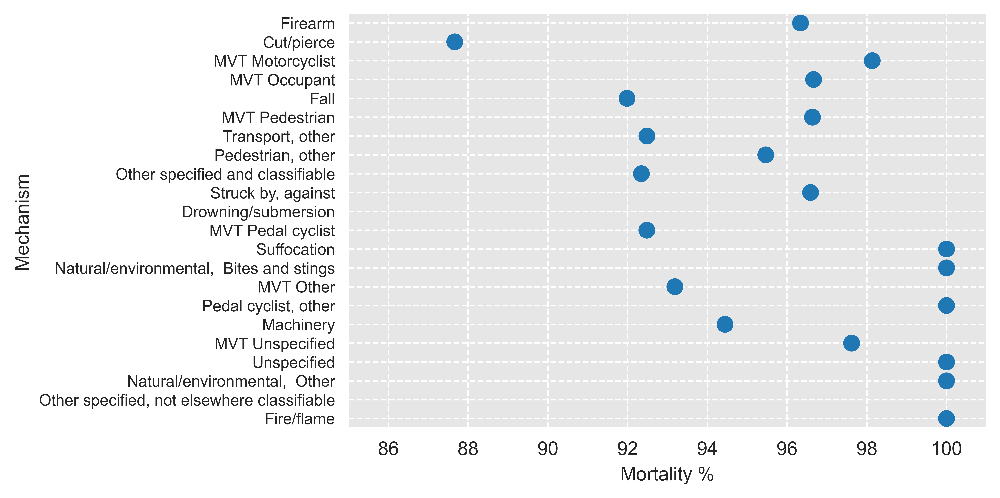

In [112]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.pointplot(data=mortality_mechanism_table,
               x='Mortality %',
               y='Mechanism', 
               ci=None,
               orient='h',
               join=False)
g.tick_params(axis='y', rotation=0, labelsize='small')
plt.grid(True, which='both', linestyle='--')
g.set_xlim(85, 101)
plt.show()

# `MAJOR FINDING: THERE IS LITERALLY A STUPID DATA FIELD THAT IS FOR DAMAGE CONTROL SURGERY AND THE MINUTES FROM ARRIVAL THAT USES THE WORD THORACOTOMY I HATE ALL OF THE THINGS`

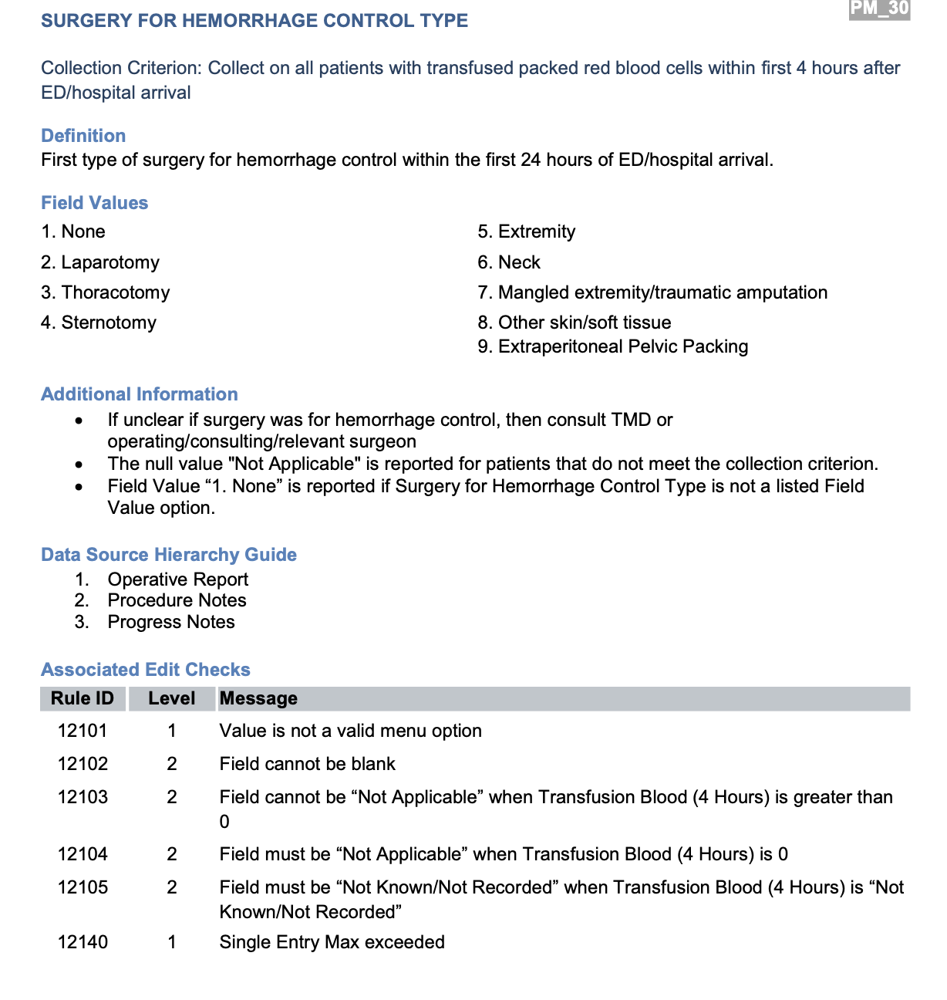

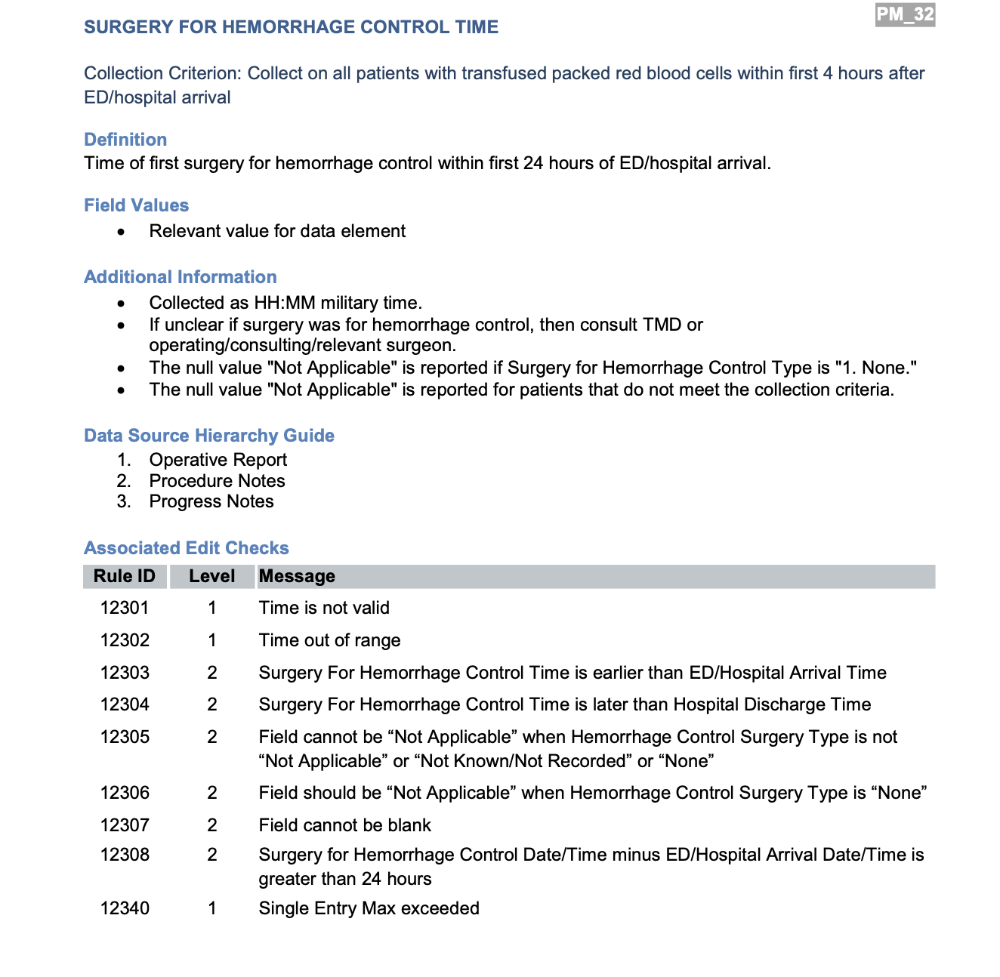

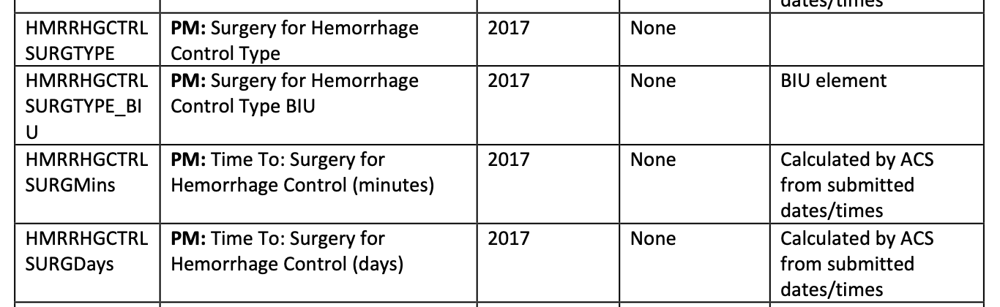

# Created a new notebook to show the results using These Damage Control Surgery Data Fields Separately to Compare to my filters